In [1]:
using DifferentialEquations, Plots
using DifferentialEquations
using Plots
using LaTeXStrings
using Sundials
using LatinHypercubeSampling

In [2]:
function Immune!(du,u,h,p,t)
    
    hist1 = h(p, t-tau)[1] #V
    hist2 = h(p, t-tau)[2] #S
    hist3 = h(p, t-tau)[3] #I
    hist4 = h(p, t-tau)[4] #R
    ##
    hist5 = h(p, t-taub)[1] #V
    hist6 = h(p, t-taub)[10] #B_N
    ##
    du[1] = phat*u[3]-dV*u[1]-(Emax*u[1]*(u[14]^h2))/((Ic)^h2+u[14]^h2);#V,primary infection 
    du[2] = lamS*(1-(u[2]+u[3]+u[4]+u[5])/Smax)*u[2]-beta*u[2]*u[1];#S
    du[3] = (beta/(1+u[7]/eps_F_I))*hist1*hist2*u[8]-dI*u[3];#I
    du[4] = lamS*(1-(u[2]+u[3]+u[4]+u[5])/Smax)*u[4]+(beta*hist1*hist2)*u[9]/(1+eps_F_I/u[7]);#R
    du[5] = dI*u[3]-dD*u[5];#D
    du[6] = psi_F_prod+p_F_I*u[3]/(u[3]+eta_F_I)-k_lin_F*u[6]-k_B_F*((T_star+u[3])*A_F-u[7])*u[6]+k_U_F*u[7];#FU
    du[7] = -k_int_F*u[7]+k_B_F*((T_star+u[3])*A_F-u[7])*u[6]-k_U_F*u[7];#FB
    du[8] = u[8]*delta*(hist3-u[3])#A1
    du[9] = u[9]*delta*(hist4-u[4])#A2
    ###Primary Immune Response
    du[10] = rhob*u[10]-mu_b*u[1]*u[10]-delta_bn*u[10]#B_N
    du[11] = mu_b*(hist5)*hist6*P1+rho*(2*Pb-1)*(alpha_v*u[1]/(u[1]+S_v)+(alpha_IL4*u[16])/(S_IL4+u[16]))*u[11]-delta_b*u[11]#B
    du[12] = mu_b*(hist5)*hist6*(1-P1)-delta_ps*u[12];#PS
    du[13] = (1-Pb)*Pp*rho*u[11]-delta_p*u[13];#P 
    du[14] = (1-Pb)*(1-Pp)*rho*u[11];#M
    du[15] = a_p*u[13]+a_b*u[12]-delta_a*u[15];#A
    du[16] = mu_t*u[11]-delta_t*u[16];#T_fh
    du[17] = mu_IL4*u[16]-delta_IL4*u[17];#IL4
end

Immune! (generic function with 1 method)

In [3]:
tspan = (0.0,360);
#####################################
###
beta = 0.3;eta_F_I=0.022328;
tau= 0.17;Smax = 0.16;lamS = 0.74; dI = 0.1; dD=8;phat =394;dV = 8.4;
psi_F_prod=0.25;k_lin_F=16.635;k_B_F=0.0107;
T_star=1.104*1e-4;k_U_F=6.072;k_int_F=16.968;R_F_T = 1000;R_F_I = 1300;MM_F = 19000;avo=6.02214E23;
p_F_I=2.8235*1e4*1e-4;eps_F_I =2*1e-4;
A_F = (MM_F/avo)*(R_F_I+R_F_T)*(1/5000)*(10^9*1e12);delta = 0.1;delta_m=0;
###Humoral Immunity
delta_ps=0.15
P1=0.7
####
rhops=0.4
rhob=0.0046
mu_b=3.9E-6;
delta_bn=0.0124;
taub=5;
rho=0.0046;
Pb=0.1;Pp=0.9;
###
# a_b=0.0001;a_p=0.0001;#Minimum,Used
a_b=0.8;a_p=0.8;#Mean,Used
# a_b=200;a_p=200;#Maximum,Used
####
alpha_v=0.1;alpha_IL4=0.1;#Chosen
S_v=6;#Chosen
S_IL4=1E+4;
delta_b=0.0322;
delta_p=0.01;
delta_a=0.034;
mu_t=0.0355;delta_t=0.055;
mu_IL4=1.3;delta_IL4=52.63;
B0=1E+9
V0=4.5;
# V0=10;
Fu0=0.015;
###Final:
Emax=99;h2=1.2;Ic=662#Wuhan
# Emax=98.7;h2=0.79;Ic=5893.32#Omicron
###
u0=[V0; 0.16;0.0 ;0.0 ; 0.0;Fu0 ;1.1e-8 ;1.0 ;1.0;B0;0.0;0.0;0.0;0.0;0.0;0.0;0.0];
lags = [tau,taub];
####
#Primary
h(p,t) = [4.5; 0.16;0.0 ;0.0 ; 0.0;0.015 ;1.1e-8 ;1.0 ;1.0;B0;0.0;0.0;0.0;0.0;0.0;0.0;0.0];
alg = MethodOfSteps(Tsit5())
###################################
p1=[tau,phat,dV,beta,Smax,lamS,dI,eps_F_I,dD,psi_F_prod, p_F_I,eta_F_I,k_lin_F,k_B_F,T_star,k_U_F,k_int_F,A_F,
k_B_F,delta,mu_b,delta_bn,taub,rho,Pb,Pp,alpha_v,alpha_IL4,S_IL4,S_v,delta_b,delta_p,delta_m,a_p,a_b,B0,
delta_a,mu_t,delta_t,mu_IL4,delta_IL4,Emax,h2,Ic,n,P1, delta_ps];
z1=  DDEProblem(Immune!,u0,h,tspan,p1;constant_lags=lags);
sol = solve(z1,saveat=0:0.01:360,alg,abstol=1e-8,reltol=1e-8);

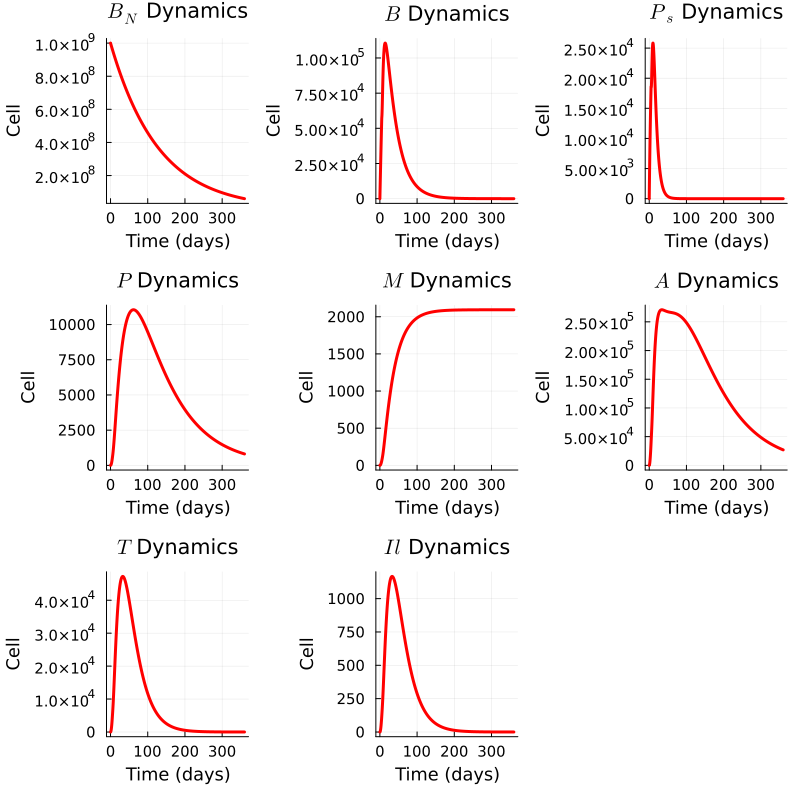

In [4]:
plot(sol.t, sol[14,:], label="", xlabel="Time (days)", ylabel="")
xlabel_size = 12
ylabel_size = 12
tick_label_size = 10

p1 = plot(sol.t, sol[10, :], label="C(t)", xlabel="Time (days)", ylabel="Cell", title=L"$B_N$ Dynamics", linewidth=3, color=:red, xguidefontsize=xlabel_size, yguidefontsize=ylabel_size, xtickfontsize=tick_label_size, ytickfontsize=tick_label_size)
p2 = plot(sol.t, sol[11, :], label="S(t)", xlabel="Time (days)", ylabel="Cell", title=L"$B$ Dynamics", linewidth=3, color=:red, xguidefontsize=xlabel_size, yguidefontsize=ylabel_size, xtickfontsize=tick_label_size, ytickfontsize=tick_label_size)
p3 = plot(sol.t, sol[12, :], label="Mphi2(t)", xlabel="Time (days)", ylabel="Cell", title=L"$P_s$ Dynamics", linewidth=3, color=:red, xguidefontsize=xlabel_size, yguidefontsize=ylabel_size, xtickfontsize=tick_label_size, ytickfontsize=tick_label_size)
p4 = plot(sol.t, sol[13, :], label="M(t)", xlabel="Time (days)", ylabel="Cell", title=L"$P$ Dynamics", linewidth=3, color=:red, xguidefontsize=xlabel_size, yguidefontsize=ylabel_size, xtickfontsize=tick_label_size, ytickfontsize=tick_label_size)
p5 = plot(sol.t, sol[14, :], label="Treg(t)", xlabel="Time (days)", ylabel="Cell", title = L"$M$ Dynamics", linewidth=3, color=:red, xguidefontsize=xlabel_size, yguidefontsize=ylabel_size, xtickfontsize=tick_label_size, ytickfontsize=tick_label_size)
p6 = plot(sol.t, sol[15, :], label="Teff(t)", xlabel="Time (days)", ylabel="Cell", title=L"$A$ Dynamics", linewidth=3, color=:red, xguidefontsize=xlabel_size, yguidefontsize=ylabel_size, xtickfontsize=tick_label_size, ytickfontsize=tick_label_size)
p7 = plot(sol.t, sol[16, :], label="Mphi1(t)", xlabel="Time (days)", ylabel="Cell", title=L"$T$ Dynamics", linewidth=3, color=:red, xguidefontsize=xlabel_size, yguidefontsize=ylabel_size, xtickfontsize=tick_label_size, ytickfontsize=tick_label_size)
p8 = plot(sol.t, sol[17, :], label="Mphi2(t)", xlabel="Time (days)", ylabel="Cell", title=L"$Il$ Dynamics", linewidth=3, color=:red, xguidefontsize=xlabel_size, yguidefontsize=ylabel_size, xtickfontsize=tick_label_size, ytickfontsize=tick_label_size)
# Combine the individual plots into a single figure with 7 subplots
plot(p1,p2, p3,p4,p5,p6,p7,p8, layout=(3, 3), size=(800,800),legend=false)

In [6]:
#No delay, No History: (Primary response: ScatterPlot)
using DifferentialEquations
using Plots
using LsqFit
import Distributions: Uniform
using StatsBase
using LaTeXStrings
using HypothesisTests
using Random 

function Immune!(du,u,p,t)
    
    tau,phat,dV,beta,Smax,lamS,dI,eps_F_I,dD,psi_F_prod, p_F_I,eta_F_I,k_lin_F,k_B_F,T_star,k_U_F,k_int_F,A_F,
    k_B_F,delta,mu_b,delta_bn,taub,rho,Pb,Pp,alpha_v,alpha_IL4,S_IL4,S_v,delta_b,delta_p,delta_m,a_p,a_b,
    delta_a,mu_t,delta_t,mu_IL4,delta_IL4,Emax,h2,Ic,n,P1, delta_ps,rhob = p

    du[1] = phat*u[3]-dV*u[1]-n*(Emax*u[1]*(u[14]^h2))/((Ic)^h2+u[14]^h2);#V,primary infection 
    du[2] = lamS*(1-(u[2]+u[3]+u[4]+u[5])/Smax)*u[2]-beta*u[2]*u[1];#S
    du[3] = (beta/(1+u[7]/eps_F_I))*u[2]*u[1]-dI*u[3];#I
    du[4] = lamS*(1-(u[2]+u[3]+u[4]+u[5])/Smax)*u[4]+(beta*u[2]*u[1])/(1+eps_F_I/u[7]);#R
    du[5] = dI*u[3]-dD*u[5];#D
    du[6] = psi_F_prod+p_F_I*u[3]/(u[3]+eta_F_I)-k_lin_F*u[6]-k_B_F*((T_star+u[3])*A_F-u[7])*u[6]+k_U_F*u[7];#FU
    du[7] = -k_int_F*u[7]+k_B_F*((T_star+u[3])*A_F-u[7])*u[6]-k_U_F*u[7];#FB
    ###Primary Immune Response
    du[8] = rhob*u[8]-mu_b*u[1]*u[8]-delta_bn*u[8]#B_N
    du[9] = mu_b*u[1]*u[8]*P1+rho*(2*Pb-1)*(alpha_v*u[1]/(u[1]+S_v)+(alpha_IL4*u[14])/(S_IL4+u[14]))*u[9]-delta_b*u[9]#B
    du[10] = mu_b*u[1]*u[8]*(1-P1)-delta_ps*u[10];#PS
    du[11] = (1-Pb)*Pp*rho*u[9]-delta_p*u[11];#P 
    du[12] = (1-Pb)*(1-Pp)*rho*u[9];#M
    du[13] = a_p*u[11]+a_b*u[10]-delta_a*u[13];#A
    du[14] = mu_t*u[9]-delta_t*u[14];#T_fh
    du[15] = mu_IL4*u[14]-delta_IL4*u[15];#IL4
end
###
tspan = (0.0,360);
#####################################
n=0.5;beta = 0.3;eta_F_I=0.022328;
tau= 0.17;Smax = 0.16;lamS = 0.74; dI = 0.1; dD=8;phat =394;dV = 8.4;
psi_F_prod=0.25;k_lin_F=16.635;k_B_F=0.0107;
T_star=1.104*1e-4;k_U_F=6.072;k_int_F=16.968;R_F_T = 1000;R_F_I = 1300;MM_F = 19000;avo=6.02214E23;
p_F_I=2.8235*1e4*1e-4;eps_F_I =2*1e-4;
A_F = (MM_F/avo)*(R_F_I+R_F_T)*(1/5000)*(10^9*1e12);delta = 0.1;delta_m=0;
###Humoral Immunity
# delta_ps=0.15;P1=0.7;rhops=0.4;rhob=0.0046;mu_b=3.9E-6;
# delta_bn=0.0124;taub=5;rho=0.0046;Pb=0.1;Pp=0.9;
# a_b=0.8;a_p=0.8;P1=0.9;alpha_v=0.1;alpha_IL4=0.1;S_v=6;S_IL4=1E+4;
#delta_b=0.0322;delta_p=0.01;delta_a=0.034;mu_t=0.0355;delta_t=0.055;mu_IL4=1.3;delta_IL4=52.63;
###Final:
Emax=99;h2=1.2;Ic=662*10000
###
u0=[4.5; 0.16;0.0 ;0.0 ; 0.0;0.015;1.1e-8 ;1E+9;0.0;0.0;0.0;0.0;0.0;0.0;0.0];
# ###################################
# p1=[tau,phat,dV,beta,Smax,lamS,dI,eps_F_I,dD,psi_F_prod, p_F_I,eta_F_I,k_lin_F,k_B_F,T_star,k_U_F,k_int_F,A_F,
# k_B_F,delta,mu_b,delta_bn,taub,rho,Pb,Pp,alpha_v,alpha_IL4,S_IL4,S_v,delta_b,delta_p,delta_m,a_p,a_b,B0,
# delta_a,mu_t,delta_t,mu_IL4,delta_IL4,Emax,h2,Ic,n,P1, delta_ps];
# z1=  ODEProblem(Immune!,u0,tspan,p1);
# sol = solve(z1,saveat=0:0.01:360,abstol=1e-8,reltol=1e-8);
#-----------------------------------------------------------------------------------------------
num_samples = 1000
###
delta_ps_samples = rand(Uniform(0.5*0.15, 1.5*0.15), num_samples)#1:delta_ps
P1_samples = rand(Uniform(0.5*0.7, 1.5*0.7), num_samples)#2:P1
rhops_samples = rand(Uniform(0.5*0.4, 1.5*0.4), num_samples)#3:rhops
rhob_samples = rand(Uniform(0.5*0.0046, 1.5*0.0046), num_samples)#4:rhob
mu_b_samples = rand(Uniform(0.5*3.9E-6, 1.5*3.9E-6), num_samples)#5:mu_b
delta_bn_samples = rand(Uniform(0.5*0.0124, 1.5*0.0124), num_samples)#6:delta_bn
taub_samples = rand(Uniform(0.5*5, 1.5*5), num_samples)#7:taub
rho_samples = rand(Uniform(0.5*0.0046, 1.5*0.0046), num_samples)#8:rho
Pb_samples = rand(Uniform(0.5*0.1, 1.5*0.1), num_samples)#9:Pb
Pp_samples = rand(Uniform(0.5*0.9, 1.5*0.9), num_samples)#10:Pp
a_b_samples = rand(Uniform(0.5*0.8, 1.5*0.8), num_samples)#11:a_b
a_p_samples = rand(Uniform(0.5*0.8, 1.5*0.8), num_samples)#12:a_p
alpha_v_samples = rand(Uniform(0.5*0.1, 1.5*0.1), num_samples)#13:alpha_v
alpha_IL4_samples = rand(Uniform(0.5*0.1, 1.5*0.1), num_samples)#14:alpha_IL4
S_v_samples = rand(Uniform(0.5*6, 1.5*6), num_samples)#15:S_v
S_IL4_samples = rand(Uniform(0.5*1E+4, 1.5*1E+4), num_samples)#16:S_IL4
delta_b_samples = rand(Uniform(0.5*0.0322, 1.5*0.0322), num_samples)#17:delta_b
delta_p_samples = rand(Uniform(0.5*0.01, 1.5*0.01), num_samples)#18:delta_p
delta_a_samples = rand(Uniform(0.5*0.034, 1.5*0.034), num_samples)#19:delta_a
mu_t_samples = rand(Uniform(0.5*0.0355, 1.5*0.0355), num_samples)#20:mu_t
delta_t_samples = rand(Uniform(0.5*0.055, 1.5*0.055), num_samples)#21:delta_t
mu_IL4_samples = rand(Uniform(0.5*1.3, 1.5*1.3), num_samples)#22:mu_IL4
delta_IL4_samples = rand(Uniform(0.5*52.63, 1.5*52.63), num_samples)#23:delta_IL4



max_u_values = []
####
delta_ps_values = []#1
P1_values = []#2
rhops_values = []#3
rhob_values = []#4
mu_b_values = []#5
delta_bn_values = []#6
taub_values = []#7
rho_values = []#8
Pb_values = []#9
Pp_values = []#10
a_b_values = []#11
a_p_values = []#12
alpha_v_values = []#13
alpha_IL4_values = []#14
S_v_values = []#15
S_IL4_values = []#16
delta_b_values = []#17
delta_p_values = []#18
delta_a_values = []#19
mu_t_values = []#20
delta_t_values = []#21
mu_IL4_values = []#22
delta_IL4_values = []#23



# for (delta_ps,P1,rhops,rhob,mu_b,delta_bn,taub,rho,Pb,Pp,a_b,a_p,alpha_v,alpha_IL4,S_v,S_IL4,delta_b,delta_p,delta_a,mu_t,delta_t,mu_IL4,delta_IL4) in zip(delta_ps_samples, P1_samples, rhops_samples, rhob_samples , mu_b_samples ,delta_bn_samples, taub_samples,
# rho_samples, Pb_samples, Pp_samples, a_b_samples, a_p_samples, alpha_v_samples, alpha_IL4_samples, S_v_samples,
# S_IL4_samples, delta_b_samples,delta_p_samples, mu_t_samples, delta_t_samples, mu_IL4_samples, delta_IL4_samples)
#     prob = ODEProblem(Immune!, u0, tspan, [tau,phat,dV,beta,Smax,lamS,dI,eps_F_I,dD,psi_F_prod, p_F_I,eta_F_I,k_lin_F,k_B_F,T_star,k_U_F,k_int_F,A_F,
#  k_B_F,delta,mu_b,delta_bn,taub,rho,Pb,Pp,alpha_v,alpha_IL4,S_IL4,S_v,delta_b,delta_p,delta_m,a_p,a_b,B0,
#  delta_a,mu_t,delta_t,mu_IL4,delta_IL4,Emax,h2,Ic,n,P1, delta_ps])

for (delta_ps,P1,rhops,rhob,mu_b,delta_bn,taub,rho,Pb,Pp,a_b,a_p,alpha_v,alpha_IL4,S_v,S_IL4,delta_b,delta_p,delta_a,mu_t,delta_t,mu_IL4,delta_t,mu_IL4,delta_IL4) in zip(delta_ps_samples, P1_samples, rhops_samples, rhob_samples, mu_b_samples,delta_bn_samples,taub_samples,rho_samples,Pb_samples,Pp_samples,a_b_samples,a_p_samples,alpha_v_samples,alpha_IL4_samples,S_v_samples,S_IL4_samples,delta_b_samples,delta_p_samples,delta_a_samples,mu_t_samples,delta_t_samples,mu_IL4_samples,delta_t_samples,mu_IL4_samples,delta_IL4_samples)
    prob = ODEProblem(Immune!, u0, tspan, [tau,phat,dV,beta,Smax,lamS,dI,eps_F_I,dD,psi_F_prod, p_F_I,eta_F_I,k_lin_F,k_B_F,T_star,k_U_F,k_int_F,A_F,
 k_B_F,delta,mu_b,delta_bn,taub,rho,Pb,Pp,alpha_v,alpha_IL4,S_IL4,S_v,delta_b,delta_p,delta_m,a_p,a_b,
 delta_a,mu_t,delta_t,mu_IL4,delta_IL4,Emax,h2,Ic,n,P1, delta_ps,rhob])
    sol = solve(prob,saveat=0:0.01:360,abstol=1e-8,reltol=1e-8)
    
    
    max_u = maximum([point[13] for point in sol.u])
#     max_u2 = maximum([point[2] for point in sol.u])
#     max_u = max(max_u1, max_u2)

    push!(max_u_values, max_u)
    push!(delta_ps_values, delta_ps)#1
    push!(P1_values, P1)#2
    push!(rhops_values, rhops)#3
    push!(rhob_values, rhob)#4
    push!(mu_b_values, mu_b)#5
    push!(delta_bn_values, delta_bn)#6
    push!(taub_values, taub)#7
    push!(rho_values, rho)#8
    push!(Pb_values, Pb)#9
    push!(Pp_values, Pp)#10
    push!(a_b_values, a_b)#11
    push!(a_p_values, a_p)#12
    push!(alpha_v_values, alpha_v)#13
    push!(alpha_IL4_values, alpha_IL4)#14
    push!(S_v_values, S_v)#15
    push!(S_IL4_values, S_IL4)#16
    push!(delta_b_values, delta_b)#17
    push!(delta_p_values, delta_p)#18
    push!(delta_a_values, delta_a)#19
    push!(mu_t_values, mu_t)#20
    push!(delta_t_values, delta_t)#21
    push!(mu_IL4_values, mu_IL4)#22
    push!(delta_IL4_values, delta_IL4)#23
end

# Scatter plot of maximum u[1] or u[2] values against σ values
#scatter(delta_ps_values, max_u_values/378026.3, xlabel="a_b", ylabel="Max of u[1] or u[2]", title="Max of u[1] or u[2] for Various a_b", legend=false)

# Scatter plot of maximum u[1] or u[2] values against ρ values
#scatter!(a_p_values, max_u_values, xlabel="a_p", ylabel="Max of u[1] or u[2]", title="Max of u[1] or u[2] for Various a_p", legend=false)

##
# BN = [(t,u[8]) for (u,t) in tuples(sol)]
# B = [(t,u[9]) for (u,t) in tuples(sol)]
# Ps = [(t,u[10]) for (u,t) in tuples(sol)]
# P = [(t,u[11]) for (u,t) in tuples(sol)]
# M = [(t,u[12]) for (u,t) in tuples(sol)]
# A = [(t,u[13]) for (u,t) in tuples(sol)]
# Tfh = [(t,u[14]) for (u,t) in tuples(sol)]
# IL4 = [(t,u[15]) for (u,t) in tuples(sol)]


# using DelimitedFiles
# writedlm("/Users/suzan/Desktop/BN2.txt", BN)
# writedlm("/Users/suzan/Desktop/B2.txt", B)
# writedlm("/Users/suzan/Desktop/Ps2.txt", Ps)
# writedlm("/Users/suzan/Desktop/P2.txt", P)
# writedlm("/Users/suzan/Desktop/M2.txt", M)
# writedlm("/Users/suzan/Desktop/A2.txt", A)
# writedlm("/Users/suzan/Desktop/Tfh2.txt", Tfh)
# writedlm("/Users/suzan/Desktop/IL42.txt", IL4)
#*********
# Convert max_u_values and delta_ps_values to Float64
max_u_values_float = Float64.(max_u_values)
a_b_values_float = Float64.(a_b_values)


# Calculate Spearman's correlation coefficient
spearman_correlation_ab = corspearman(a_b_values_float, max_u_values_float)

# Perform a permutation test for the p-value
n_permutations = 10000
more_extreme = 0
for i in 1:n_permutations
    permuted = shuffle(max_u_values_float)
    if abs(corspearman(a_b_values_float, permuted)) >= abs(spearman_correlation_ab)
        more_extreme += 1
    end
end

p_value = more_extreme / n_permutations

# Fit a linear model
model(x, p) = p[1] * x .+ p[2]
fit = curve_fit(model, a_b_values_float, max_u_values_float, [0.0, 0.0])

# Extract the parameters of the fitted line
slope, intercept = coef(fit)

# Generate values for the regression line
regression_x = minimum(a_b_values_float):0.01:maximum(a_b_values_float)
regression_y = slope .* regression_x .+ intercept

# Adjust the plot size
plot_size = (600, 500)

# Create scatter plot
p = scatter(
    a_b_values_float, 
    max_u_values_float / 378026.3, 
    xlabel=L"\alpha_b" * L"(ng/10^9 cell/day)", 
    ylabel=L"A_{\mathrm{max}}" * "(ng/ml)", 
    title="Primary response", 
    titlefontsize=22, 
    legend=false, 
    color=:blue, 
    markerstrokewidth=0, 
    markersize=5,
    size=plot_size, 
    xguidefontsize=25, 
    yguidefontsize=25, 
    xtickfontsize=17, 
    ytickfontsize=17, 
    fontfamily="Arial"
)

# Overlay the regression line
plot!(regression_x, regression_y/378026.3, label="Regression Line", color=:orange, linewidth=6, framestyle=:box, grid=false)

# Annotate with Spearman correlation and p-value
xpos = maximum(a_b_values_float) * 0.6
ypos = maximum(max_u_values_float / 378026.3) * 0.93
# Annotate with Spearman correlation and p-value
# annotate!(p, [(xpos, ypos, text("r = $(round(spearman_correlation_ab, digits=2))\np-value = $(round(p_value, digits=4))", 10, :right))])
annotate!(p, [(xpos, ypos, text("r = $(round(spearman_correlation_ab, digits=2))\np-value <0.001", 16, :right))])
savefig(p, "/Users/suzan/Desktop/my_plot.pdf")

"/Users/suzan/Desktop/my_plot.pdf"

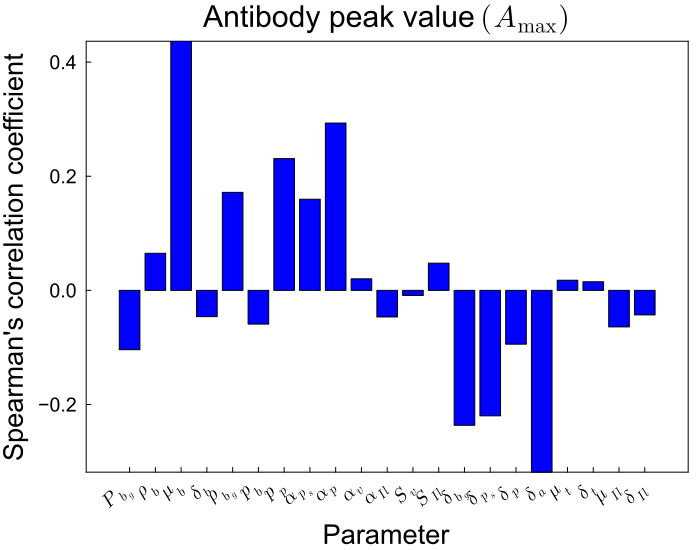

"/Users/suzan/Desktop/my_plot.pdf"

In [3]:
#No delay, No History: (Primary Response, Correlation Plot)
using DifferentialEquations
using Plots
using LsqFit
import Distributions: Uniform
using StatsBase
using Statistics
using LaTeXStrings
using Sundials
using HypothesisTests
using Random 

function Immune!(du,u,p,t)
    
    tau,phat,dV,beta,Smax,lamS,dI,eps_F_I,dD,psi_F_prod, p_F_I,eta_F_I,k_lin_F,k_B_F,T_star,k_U_F,k_int_F,A_F,
    k_B_F,delta,mu_b,delta_bn,rho,Pb,Pp,alpha_v,alpha_IL4,S_IL4,S_v,delta_b,delta_p,delta_m,a_p,a_b,
    delta_a,mu_t,delta_t,mu_IL4,delta_IL4,Emax,h2,Ic,n,P1, delta_ps,rhob = p

    du[1] = phat*u[3]-dV*u[1]-n*(Emax*u[1]*(u[14]^h2))/((Ic)^h2+u[14]^h2);#V,primary infection 
    du[2] = lamS*(1-(u[2]+u[3]+u[4]+u[5])/Smax)*u[2]-beta*u[2]*u[1];#S
    du[3] = (beta/(1+u[7]/eps_F_I))*u[2]*u[1]-dI*u[3];#I
    du[4] = lamS*(1-(u[2]+u[3]+u[4]+u[5])/Smax)*u[4]+(beta*u[2]*u[1])/(1+eps_F_I/u[7]);#R
    du[5] = dI*u[3]-dD*u[5];#D
    du[6] = psi_F_prod+p_F_I*u[3]/(u[3]+eta_F_I)-k_lin_F*u[6]-k_B_F*((T_star+u[3])*A_F-u[7])*u[6]+k_U_F*u[7];#FU
    du[7] = -k_int_F*u[7]+k_B_F*((T_star+u[3])*A_F-u[7])*u[6]-k_U_F*u[7];#FB
    ###Primary Immune Response
    du[8] = rhob*u[8]-mu_b*u[1]*u[8]-delta_bn*u[8]#B_N
    du[9] = mu_b*u[1]*u[8]*P1+rho*(2*Pb-1)*(alpha_v*u[1]/(u[1]+S_v)+(alpha_IL4*u[14])/(S_IL4+u[14]))*u[9]-delta_b*u[9]#B
    du[10] = mu_b*u[1]*u[8]*(1-P1)-delta_ps*u[10];#PS
    du[11] = (1-Pb)*Pp*rho*u[9]-delta_p*u[11];#P 
    du[12] = (1-Pb)*(1-Pp)*rho*u[9];#M
    du[13] = a_p*u[11]+a_b*u[10]-delta_a*u[13];#A
    du[14] = mu_t*u[9]-delta_t*u[14];#T_fh
    du[15] = mu_IL4*u[14]-delta_IL4*u[15];#IL4
end
###
tspan = (0.0,360);
#####################################
n=0.5;beta = 0.3;eta_F_I=0.022328;
tau= 0.17;Smax = 0.16;lamS = 0.74; dI = 0.1; dD=8;phat =394;dV = 8.4;
psi_F_prod=0.25;k_lin_F=16.635;k_B_F=0.0107;
T_star=1.104*1e-4;k_U_F=6.072;k_int_F=16.968;R_F_T = 1000;R_F_I = 1300;MM_F = 19000;avo=6.02214E23;
p_F_I=2.8235*1e4*1e-4;eps_F_I =2*1e-4;
A_F = (MM_F/avo)*(R_F_I+R_F_T)*(1/5000)*(10^9*1e12);delta = 0.1;delta_m=0;
###Humoral Immunity
# delta_ps=0.15;P1=0.7;rhops=0.4;rhob=0.0046;mu_b=3.9E-6;
# delta_bn=0.0124;taub=5;rho=0.0046;Pb=0.1;Pp=0.9;
# a_b=0.8;a_p=0.8;P1=0.9;alpha_v=0.1;alpha_IL4=0.1;S_v=6;S_IL4=1E+4;
#delta_b=0.0322;delta_p=0.01;delta_a=0.034;mu_t=0.0355;delta_t=0.055;mu_IL4=1.3;delta_IL4=52.63;
###Final:
Emax=99;h2=1.2;Ic=662*10000
###
u0=[4.5; 0.16;0.0 ;0.0 ; 0.0;0.015;1.1e-8 ;1E+9;0.0;0.0;0.0;0.0;0.0;0.0;0.0];
# ###################################
# p1=[tau,phat,dV,beta,Smax,lamS,dI,eps_F_I,dD,psi_F_prod, p_F_I,eta_F_I,k_lin_F,k_B_F,T_star,k_U_F,k_int_F,A_F,
# k_B_F,delta,mu_b,delta_bn,taub,rho,Pb,Pp,alpha_v,alpha_IL4,S_IL4,S_v,delta_b,delta_p,delta_m,a_p,a_b,B0,
# delta_a,mu_t,delta_t,mu_IL4,delta_IL4,Emax,h2,Ic,n,P1, delta_ps];
# z1=  ODEProblem(Immune!,u0,tspan,p1);
# sol = solve(z1,saveat=0:0.01:360,abstol=1e-8,reltol=1e-8);
#-----------------------------------------------------------------------------------------------
num_samples = 1000
delta_ps_samples = rand(Uniform(0.5*0.15, 1.5*0.15), num_samples)#1:delta_ps
P1_samples = rand(Uniform(0.5*0.7, 1.5*0.7), num_samples)#2:P1
rhob_samples = rand(Uniform(0.5*0.0046, 1.5*0.0046), num_samples)#4:rhob
mu_b_samples = rand(Uniform(0.5*3.9E-6, 1.5*3.9E-6), num_samples)#5:mu_b
delta_bn_samples = rand(Uniform(0.5*0.0124, 1.5*0.0124), num_samples)#6:delta_bn
rho_samples = rand(Uniform(0.5*0.0046, 1.5*0.0046), num_samples)#8:rho
Pb_samples = rand(Uniform(0.5*0.1, 1.5*0.1), num_samples)#9:Pb
Pp_samples = rand(Uniform(0.5*0.9, 1.5*0.9), num_samples)#10:Pp
a_b_samples = rand(Uniform(0.5*0.8, 1.5*0.8), num_samples)#11:a_b
a_p_samples = rand(Uniform(0.5*0.8, 1.5*0.8), num_samples)#12:a_p
alpha_v_samples = rand(Uniform(0.5*0.1, 1.5*0.1), num_samples)#13:alpha_v
alpha_IL4_samples = rand(Uniform(0.5*0.1, 1.5*0.1), num_samples)#14:alpha_IL4
S_v_samples = rand(Uniform(0.5*6, 1.5*6), num_samples)#15:S_v
S_IL4_samples = rand(Uniform(0.5*1E+4, 1.5*1E+4), num_samples)#16:S_IL4
delta_b_samples = rand(Uniform(0.5*0.0322, 1.5*0.0322), num_samples)#17:delta_b
delta_p_samples = rand(Uniform(0.5*0.01, 1.5*0.01), num_samples)#18:delta_p
delta_a_samples = rand(Uniform(0.5*0.034, 1.5*0.034), num_samples)#19:delta_a
mu_t_samples = rand(Uniform(0.5*0.0355, 1.5*0.0355), num_samples)#20:mu_t
delta_t_samples = rand(Uniform(0.5*0.055, 1.5*0.055), num_samples)#21:delta_t
mu_IL4_samples = rand(Uniform(0.5*1.3, 1.5*1.3), num_samples)#22:mu_IL4
delta_IL4_samples = rand(Uniform(0.5*52.63, 1.5*52.63), num_samples)#23:delta_IL4

max_u_values = []
peak_times = []
####
P1_values = []#1
rhob_values = []#2
mu_b_values = []#3
delta_bn_values = []#4
rho_values = []#5
Pb_values = []#6
Pp_values = []#7
a_b_values = []#8
a_p_values = []#9
alpha_v_values = []#10
alpha_IL4_values = []#11
S_v_values = []#12
S_IL4_values = []#13
delta_b_values = []#14
delta_ps_values = []#15
delta_p_values = []#16
delta_a_values = []#17
mu_t_values = []#18
delta_t_values = []#19
mu_IL4_values = []#20
delta_IL4_values = []#21


# for (delta_ps,P1,rhops,rhob,mu_b,delta_bn,taub,rho,Pb,Pp,a_b,a_p,alpha_v,alpha_IL4,S_v,S_IL4,delta_b,delta_p,delta_a,mu_t,delta_t,mu_IL4,delta_IL4) in zip(delta_ps_samples, P1_samples, rhops_samples, rhob_samples , mu_b_samples ,delta_bn_samples, taub_samples,
# rho_samples, Pb_samples, Pp_samples, a_b_samples, a_p_samples, alpha_v_samples, alpha_IL4_samples, S_v_samples,
# S_IL4_samples, delta_b_samples,delta_p_samples, mu_t_samples, delta_t_samples, mu_IL4_samples, delta_IL4_samples)
#     prob = ODEProblem(Immune!, u0, tspan, [tau,phat,dV,beta,Smax,lamS,dI,eps_F_I,dD,psi_F_prod, p_F_I,eta_F_I,k_lin_F,k_B_F,T_star,k_U_F,k_int_F,A_F,
#  k_B_F,delta,mu_b,delta_bn,taub,rho,Pb,Pp,alpha_v,alpha_IL4,S_IL4,S_v,delta_b,delta_p,delta_m,a_p,a_b,B0,
#  delta_a,mu_t,delta_t,mu_IL4,delta_IL4,Emax,h2,Ic,n,P1, delta_ps])

for (delta_ps,P1,rhob,mu_b,delta_bn,rho,Pb,Pp,a_b,a_p,alpha_v,alpha_IL4,S_v,S_IL4,delta_b,delta_p,delta_a,mu_t,delta_t,mu_IL4,delta_t,mu_IL4,delta_IL4) in zip(delta_ps_samples, P1_samples, rhob_samples, mu_b_samples,delta_bn_samples,rho_samples,Pb_samples,Pp_samples,a_b_samples,a_p_samples,alpha_v_samples,alpha_IL4_samples,S_v_samples,S_IL4_samples,delta_b_samples,delta_p_samples,delta_a_samples,mu_t_samples,delta_t_samples,mu_IL4_samples,delta_t_samples,mu_IL4_samples,delta_IL4_samples)
    prob = ODEProblem(Immune!, u0, tspan, [tau,phat,dV,beta,Smax,lamS,dI,eps_F_I,dD,psi_F_prod, p_F_I,eta_F_I,k_lin_F,k_B_F,T_star,k_U_F,k_int_F,A_F,
 k_B_F,delta,mu_b,delta_bn,rho,Pb,Pp,alpha_v,alpha_IL4,S_IL4,S_v,delta_b,delta_p,delta_m,a_p,a_b,
 delta_a,mu_t,delta_t,mu_IL4,delta_IL4,Emax,h2,Ic,n,P1, delta_ps,rhob])
    sol = solve(prob,saveat=0:0.01:360,abstol=1e-8,reltol=1e-8)
    
    max_u = maximum([point[13] for point in sol.u])
    
    
    # Find the index of the maximum value of u[13]
    max_index = argmax([point[13] for point in sol.u])
    
    # Find the corresponding time of the peak
    peak_time = sol.t[max_index]
    
    # Store the peak time
    push!(peak_times, peak_time)
    push!(max_u_values, max_u)
    push!(delta_ps_values, delta_ps)#1
    push!(P1_values, P1)#2
    push!(rhob_values, rhob)#4
    push!(mu_b_values, mu_b)#5
    push!(delta_bn_values, delta_bn)#6
    push!(rho_values, rho)#8
    push!(Pb_values, Pb)#9
    push!(Pp_values, Pp)#10
    push!(a_b_values, a_b)#11
    push!(a_p_values, a_p)#12
    push!(alpha_v_values, alpha_v)#13
    push!(alpha_IL4_values, alpha_IL4)#14
    push!(S_v_values, S_v)#15
    push!(S_IL4_values, S_IL4)#16
    push!(delta_b_values, delta_b)#17
    push!(delta_p_values, delta_p)#18
    push!(delta_a_values, delta_a)#19
    push!(mu_t_values, mu_t)#20
    push!(delta_t_values, delta_t)#21
    push!(mu_IL4_values, mu_IL4)#22
    push!(delta_IL4_values, delta_IL4)#23
end

#**********************************************************************************************************
# Compile max_u_values and all your parameters into a matrix
parameters_matrix = hcat(
    P1_values, rhob_values, mu_b_values, delta_bn_values, 
    rho_values, Pb_values, Pp_values, a_b_values, a_p_values, alpha_v_values, 
    alpha_IL4_values, S_v_values, S_IL4_values, delta_b_values, delta_ps_values, delta_p_values, 
    delta_a_values, mu_t_values, delta_t_values, mu_IL4_values, delta_IL4_values
)

# Calculate the correlation of each parameter with max_u_values
correlations = [cor(max_u_values, parameters_matrix[:, i]) for i in 1:size(parameters_matrix, 2)]

# Parameter names for labeling
param_names = [L"P_{b_g}", L"\rho_b", L"\mu_b", L"\delta_b", L"\rho_{b_g}", L"p_b", L"p_p", L"\alpha_{p_s}", L"\alpha_p", L"\alpha_v", L"\alpha_{Il}", L"S_v", L"S_{Il}", L"\delta_{b_g}", L"\delta_{p_s}", L"\delta_p", L"\delta_a", L"\mu_t", L"\delta_t", L"\mu_{Il}", L"\delta_{Il}"]

# Create a bar plot of the correlations
# Define the plot
# Define the plot
p=correlation_plot = bar(
    correlations, 
    xticks=(1:length(param_names), param_names), 
    xrotation=45, 
    legend=false, 
    ylabel="Spearman's correlation coefficient", 
    xlabel="Parameter",
    title="Antibody peak value " * L"(A_{\mathrm{max}})",  # Added space after 'value'
    grid=false, 
    framestyle=:box, 
    titlefontsize=20, 
    color=:blue,
    fontfamily="Arial",
    xtickfontsize=13,  # Set x-axis tick label size
    ytickfontsize=13,  # Set y-axis tick label size
    xguidefontsize=18, 
    yguidefontsize=18, 
    size=(700, 550) 
)


# Display the plot
display(correlation_plot)

  
savefig(p, "/Users/suzan/Desktop/my_plot.pdf")
#**********************************************************************************************************

# # # Compile peak_times and all your parameters into a matrix

# # Compile max_u_values and all your parameters into a matrix
# parameters_matrix = hcat(
#     P1_values, rhob_values, mu_b_values, delta_bn_values, 
#     rho_values, Pb_values, Pp_values, a_b_values, a_p_values, alpha_v_values, 
#     alpha_IL4_values, S_v_values, S_IL4_values, delta_b_values, delta_ps_values, delta_p_values, 
#     delta_a_values, mu_t_values, delta_t_values, mu_IL4_values, delta_IL4_values
# )

# # Calculate the correlation of each parameter with max_u_values
# correlations = [cor(peak_times, parameters_matrix[:, i]) for i in 1:size(parameters_matrix, 2)]

# # Parameter names for labeling
# param_names = [L"P_{b_g}", L"\rho_b", L"\mu_b", L"\delta_b", L"\rho_{b_g}", L"p_b", L"p_p", L"\alpha_{p_s}", L"\alpha_p", L"\alpha_v", L"\alpha_{Il}", L"S_v", L"S_{Il}", L"\delta_{b_g}", L"\delta_{p_s}", L"\delta_p", L"\delta_a", L"\mu_t", L"\delta_t", L"\mu_{Il}", L"\delta_{Il}"]

# # Create a bar plot of the correlations
# # Define the plot
# # Define the plot
# p=correlation_plot = bar(
#     correlations, 
#     xticks=(1:length(param_names), param_names), 
#     xrotation=45, 
#     legend=false, 
#     ylabel="Spearman's correlation coefficient", 
#     xlabel="Parameter",
#     title="Antibody peak time",  # Added space after 'value'
#     grid=false, 
#     framestyle=:box, 
#     titlefontsize=20, 
#     color=:blue,
#     fontfamily="Arial",
#     xtickfontsize=13,  # Set x-axis tick label size
#     ytickfontsize=13,  # Set y-axis tick label size
#     xguidefontsize=18, 
#     yguidefontsize=18, 
#     size=(700, 550) 
# )


# # Display the plot
# display(correlation_plot)

  
# savefig(p, "/Users/suzan/Desktop/my_plot.pdf")


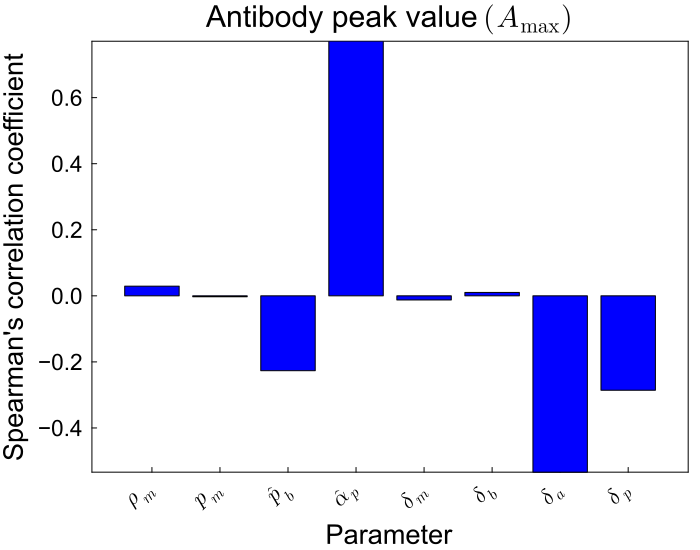

In [48]:
#No delay, No History:(Secondary Immune response)
using DifferentialEquations
using Plots
using LsqFit
import Distributions: Uniform
using StatsBase
using Statistics
using LaTeXStrings
using Sundials
using HypothesisTests
using Random 

function Immune!(du,u,p,t)
    
    tau,phat,dV,beta,Smax,lamS,dI,eps_F_I,dD,psi_F_prod, p_F_I,eta_F_I,k_lin_F,k_B_F,T_star,k_U_F,k_int_F,A_F,
    k_B_F,delta,Pb,Pp,rho_m,a_p,delta_b,delta_p,delta_a,delta_m,Emax,h2,Ic,n= p

    du[1] = phat*u[3]-dV*u[1]-n*(Emax*u[1]*(u[11]^h2))/((Ic)^h2+u[11]^h2);#V,primary infection 
    du[2] = lamS*(1-(u[2]+u[3]+u[4]+u[5])/Smax)*u[2]-beta*u[2]*u[1];#S
    du[3] = (beta/(1+u[7]/eps_F_I))*u[2]*u[1]-dI*u[3];#I
    du[4] = lamS*(1-(u[2]+u[3]+u[4]+u[5])/Smax)*u[4]+(beta*u[2]*u[1])/(1+eps_F_I/u[7]);#R
    du[5] = dI*u[3]-dD*u[5];#D
    du[6] = psi_F_prod+p_F_I*u[3]/(u[3]+eta_F_I)-k_lin_F*u[6]-k_B_F*((T_star+u[3])*A_F-u[7])*u[6]+k_U_F*u[7];#FU
    du[7] = -k_int_F*u[7]+k_B_F*((T_star+u[3])*A_F-u[7])*u[6]-k_U_F*u[7];#FB
    ###Secondary Immune Response:
    du[8] = rho_m*(2*Pb-1)*u[1]*u[8]-delta_m*u[8]#M
    du[9] = (1-Pb)*Pp*rho_m*u[8]-delta_b*u[9];#B 
    du[10] = (1-Pb)*(1-Pp)*rho_m*u[8]-delta_p*u[10];#P
    du[11] = a_p*u[10]-delta_a*u[11];#A  
end
###
tspan = (0.0,360);
#####################################
n=0.5;beta = 0.3;eta_F_I=0.022328;
tau= 0.17;Smax = 0.16;lamS = 0.74; dI = 0.1; dD=8;phat =394;dV = 8.4;
psi_F_prod=0.25;k_lin_F=16.635;k_B_F=0.0107;
T_star=1.104*1e-4;k_U_F=6.072;k_int_F=16.968;R_F_T = 1000;R_F_I = 1300;MM_F = 19000;avo=6.02214E23;
p_F_I=2.8235*1e4*1e-4;eps_F_I =2*1e-4;
A_F = (MM_F/avo)*(R_F_I+R_F_T)*(1/5000)*(10^9*1e12);delta = 0.1;delta_m=0;
###Humoral Immunity
# a_p=0.8*20;
# rho_m=0.0266;
# delta_m=0.061;
# delta_a=0.034;
# delta_b=0.0322;
# delta_p=0.01;
# Pb=0.1;
# Pp=0.9;
######################
###Final:
Emax=99;h2=1.2;Ic=662*10000
###
u0=[4.5; 0.16;0.0 ;0.0 ; 0.0;0.015 ;1.1e-8 ;2964.32;3.22;1191.16;39607.73];
# ###################################
# p1=[tau,phat,dV,beta,Smax,lamS,dI,eps_F_I,dD,psi_F_prod, p_F_I,eta_F_I,k_lin_F,k_B_F,T_star,k_U_F,k_int_F,A_F,
# k_B_F,delta,mu_b,delta_bn,taub,rho,Pb,Pp,alpha_v,alpha_IL4,S_IL4,delta_b,delta_p,delta_m,a_p,
# delta_a,mu_t,delta_t,mu_IL4,delta_IL4,rho_m,Emax,h2,Ic,rho_m,delta_m,taubm];
# ###
# z1= ODEProblem(Immune!,u0,tspan,p1);
# sol = solve(z1,saveat=0:0.01:600,abstol=1e-8,reltol=1e-8);
#-----------------------------------------------------------------------------------------------
num_samples = 1000

rho_m_samples = rand(Uniform(0.5*0.0266, 1.5*0.0266), num_samples)#1:
Pb_samples = rand(Uniform(0.5*0.1, 1.5*0.1), num_samples)#2:
Pp_samples = rand(Uniform(0.5*0.9, 1.5*0.9), num_samples)#3:
a_p_samples = rand(Uniform(0.5*0.8*20, 1.5*0.8*20), num_samples)#4:
delta_m_samples = rand(Uniform(0.5*0.061, 1.5*0.061), num_samples)#5:
delta_b_samples = rand(Uniform(0.5*0.0322, 1.5*0.0322), num_samples)#6:
delta_a_samples = rand(Uniform(0.5*0.034, 1.5*0.034), num_samples)#7:
delta_p_samples = rand(Uniform(0.5*0.01, 1.5*0.01), num_samples)#8: 


# Initialize arrays to store peak times and values
peak_times = []
peak_values = []
# ####
rho_m_values = []#1
Pb_values = []#2
Pp_values = []#3
a_p_values = []#4
delta_m_values = []#5
delta_b_values = []#6
delta_a_values = []#7
delta_p_values = []#8



for (rho_m,Pb,Pp,a_p,delta_m,delta_b,delta_a,delta_p) in zip(rho_m_samples,Pb_samples,Pp_samples,a_p_samples,delta_m_samples,delta_b_samples,delta_a_samples,delta_p_samples)
    prob = ODEProblem(Immune!, u0, tspan, [tau,phat,dV,beta,Smax,lamS,dI,eps_F_I,dD,psi_F_prod, p_F_I,eta_F_I,k_lin_F,k_B_F,T_star,k_U_F,k_int_F,A_F,
    k_B_F,delta,Pb,Pp,rho_m,a_p,delta_b,delta_p,delta_a,delta_m,Emax,h2,Ic,n])
    sol = solve(prob,saveat=0:0.01:360,abstol=1e-8,reltol=1e-8)
    
    # Find the peak value and time for u[11]
    antibody_levels = [point[11] for point in sol.u]
    max_u = maximum(antibody_levels)
    peak_time = sol.t[findmax(antibody_levels)[2]]

    push!(peak_values, max_u)
    push!(peak_times, peak_time)
    push!(rho_m_values, rho_m)#1
    push!(Pb_values, Pb)#2
    push!(Pp_values, Pp)#3
    push!(a_p_values, a_p)#4
    push!(delta_m_values, delta_m)#5
    push!(delta_b_values, delta_b)#6
    push!(delta_a_values, delta_a)#7
    push!(delta_p_values, delta_p)#8


end

# Scatter plot of maximum u[1] or u[2] values against σ values
#scatter(a_p_values, peak_values/378026.3, xlabel="a_b", ylabel="Max of u[1] or u[2]", title="Max of u[1] or u[2] for Various a_b", legend=false)

# Scatter plot of maximum u[1] or u[2] values against ρ values
#scatter!(a_p_values, max_u_values, xlabel="a_p", ylabel="Max of u[1] or u[2]", title="Max of u[1] or u[2] for Various a_p", legend=false)

##
# BN = [(t,u[8]) for (u,t) in tuples(sol)]
# B = [(t,u[9]) for (u,t) in tuples(sol)]
# Ps = [(t,u[10]) for (u,t) in tuples(sol)]
# P = [(t,u[11]) for (u,t) in tuples(sol)]
# M = [(t,u[12]) for (u,t) in tuples(sol)]
# A = [(t,u[13]) for (u,t) in tuples(sol)]
# Tfh = [(t,u[14]) for (u,t) in tuples(sol)]
# IL4 = [(t,u[15]) for (u,t) in tuples(sol)]


# using DelimitedFiles
# writedlm("/Users/suzan/Desktop/BN2.txt", BN)
# writedlm("/Users/suzan/Desktop/B2.txt", B)
# writedlm("/Users/suzan/Desktop/Ps2.txt", Ps)
# writedlm("/Users/suzan/Desktop/P2.txt", P)
# writedlm("/Users/suzan/Desktop/M2.txt", M)
# writedlm("/Users/suzan/Desktop/A2.txt", A)
# writedlm("/Users/suzan/Desktop/Tfh2.txt", Tfh)
# writedlm("/Users/suzan/Desktop/IL42.txt", IL4)
#*********
# # Convert max_u_values and delta_ps_values to Float64
# peak_values_float = Float64.(peak_values)
# a_p_values_float = Float64.(a_p_values)

# Calculate Spearman's correlation coefficient
# spearman_correlation_ab = corspearman(delta_ps_values_float, max_u_values_float)
# println("Spearman's correlation coefficient between delta_ps and max_u_values: ", spearman_correlation_ab)



# Fit a linear model
# model(x, p) = p[1] * x .+ p[2]
# fit = curve_fit(model, a_p_values_float, peak_values_float, [0.0, 0.0])

# # Extract the parameters of the fitted line
# slope, intercept = coef(fit)

# # Generate values for the regression line
# regression_x = minimum(a_p_values_float):0.01:maximum(a_p_values_float)
# regression_y = slope .* regression_x .+ intercept

# # Scatter plot of your data
# scatter(a_p_values_float, peak_values_float/378026.3004105491, xlabel="delta_ps", ylabel="Max u Value", title="Scatter Plot with Regression Line", legend=false)

# # Overlay the regression line
# plot!(regression_x, regression_y/378026.3004105491, label="Regression Line", color=:red)
#*************
# Convert peak_times to Float64
# peak_times_float = Float64.(peak_times)

# # Fit a linear model for peak times
# model_time(x, p) = p[1] * x .+ p[2]
# fit_time = curve_fit(model_time, a_p_values_float, peak_times_float, [0.0, 0.0])

# # Extract the parameters of the fitted line for peak times
# slope_time, intercept_time = coef(fit_time)

# # Generate values for the regression line for peak times
# regression_x_time = minimum(a_p_values_float):0.01:maximum(a_p_values_float)
# regression_y_time = slope_time .* regression_x_time .+ intercept_time

# # Scatter plot of peak times data
# scatter(a_p_values_float, peak_times_float, xlabel="a_p Values", ylabel="Peak Times", title="Peak Times for Various a_p Values", legend=false)

# # Overlay the regression line for peak times
# plot!(regression_x_time, regression_y_time, label="Regression Line", color=:red)
#********************
# Ensure peak_values and peak_times are Float64
peak_values_float = Float64.(peak_values)
peak_times_float = Float64.(peak_times)

# Convert each parameter array to Float64
rho_m_values_float = Float64.(rho_m_values)
Pb_values_float = Float64.(Pb_values)
Pp_values_float = Float64.(Pp_values)
a_p_values_float = Float64.(a_p_values)
delta_m_values_float = Float64.(delta_m_values)
delta_b_values_float = Float64.(delta_b_values)
delta_a_values_float = Float64.(delta_a_values)
delta_p_values_float = Float64.(delta_p_values)



# Now compile the matrices
parameters_matrix_values_float = hcat(rho_m_values_float,Pb_values_float,Pp_values_float,a_p_values_float,
delta_m_values_float,delta_b_values_float,delta_a_values_float,delta_p_values_float)

parameters_matrix_times_float = hcat(rho_m_values_float,Pb_values_float,Pp_values_float,a_p_values_float,
delta_m_values_float,delta_b_values_float,delta_a_values_float,delta_p_values_float)


# Compile max_u_values and all your parameters into a matrix
# parameters_matrix = hcat(
#     P1_values, rhob_values, mu_b_values, delta_bn_values, 
#     rho_values, Pb_values, Pp_values, a_b_values, a_p_values, alpha_v_values, 
#     alpha_IL4_values, S_v_values, S_IL4_values, delta_b_values, delta_ps_values, delta_p_values, 
#     delta_a_values, mu_t_values, delta_t_values, mu_IL4_values, delta_IL4_values
# )

# # Calculate the correlation of each parameter with max_u_values
# correlations = [cor(max_u_values, parameters_matrix[:, i]) for i in 1:size(parameters_matrix, 2)]

# # Parameter names for labeling
# param_names = [L"P_{b_g}", L"\rho_b", L"\mu_b", L"\delta_b", L"\rho_{b_g}", L"p_b", L"p_p", L"\alpha_b", L"\alpha_p", L"\alpha_v", L"\alpha_{Il}", L"S_v", L"S_{Il}", L"\delta_{b_g}", L"\delta_{p_s}", L"\delta_p", L"\delta_a", L"\mu_t", L"\delta_t", L"\mu_{Il}", L"\delta_{Il}"]

# # Create a bar plot of the correlations
# # Define the plot
# # Define the plot
# p=correlation_plot = bar(
#     correlations, 
#     xticks=(1:length(param_names), param_names), 
#     xrotation=45, 
#     legend=false, 
#     ylabel="Spearman's correlation coefficient", 
#     xlabel="Parameter",
#     title="Antibody peak value " * L"(A_{\mathrm{max}})",  # Added space after 'value'
#     grid=false, 
#     framestyle=:box, 
#     titlefontsize=20, 
#     color=:blue,
#     fontfamily="Arial",
#     xtickfontsize=13,  # Set x-axis tick label size
#     ytickfontsize=13,  # Set y-axis tick label size
#     xguidefontsize=18, 
#     yguidefontsize=18, 
#     size=(700, 550) 
# )


# # Display the plot
# display(correlation_plot)

  
# savefig(p, "/Users/suzan/Desktop/my_plot.pdf")




# Calculate correlations for peak values
correlations_values = [corspearman(parameters_matrix_values_float[:,i], peak_values_float) for i in 1:size(parameters_matrix_values_float, 2)]

# Calculate correlations for peak times
#correlations_times = [corspearman(parameters_matrix_times_float[:,i], peak_times_float) for i in 1:size(parameters_matrix_times_float, 2)]

# Parameter names for labeling
param_names_values = [L"\rho_m", L"p_m", L"\hat{p}_b", L"\hat{\alpha}_p", L"\delta_m", 
    L"\delta_b", L"\delta_a", L"\delta_p"]


# Bar plot for peak values
#correlation_plot_values = bar(correlations_values, xticks=(1:length(param_names_values), param_names_values), xrotation=45, legend=false, ylabel="Correlation Coefficient", title="Correlation of Peak Values with Parameters", grid=false, framestyle=:box)

correlation_plot_values= bar(
    correlations_values, 
    xticks=(1:length(param_names_values), param_names_values), 
    xrotation=45, 
    legend=false, 
    ylabel="Spearman's correlation coefficient", 
    xlabel="Parameter",
    title="Antibody peak value " * L"(A_{\mathrm{max}})",  # Added space after 'value'
    grid=false, 
    framestyle=:box, 
    titlefontsize=20, 
    color=:blue,
    fontfamily="Arial",
    xtickfontsize=15,  # Set x-axis tick label size
    ytickfontsize=15,  # Set y-axis tick label size
    xguidefontsize=18, 
    yguidefontsize=18, 
    size=(700, 550) 
)


# Display the plot for peak values
display(correlation_plot_values)
# savefig(p, "/Users/suzan/Desktop/my_plot.pdf")


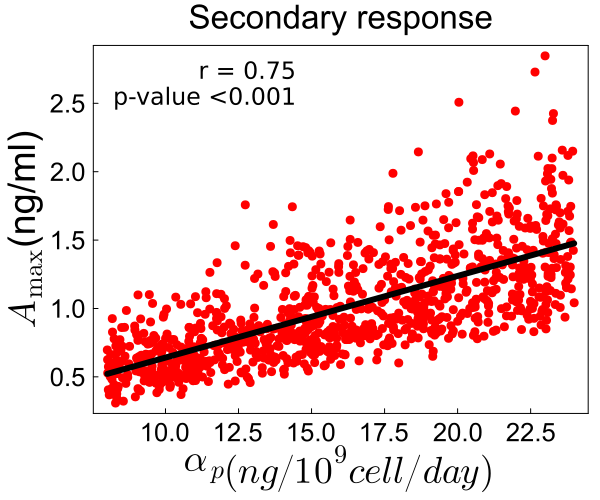

In [10]:
#No delay, No History:(Secondary Immune response, Sacatter plot)
using DifferentialEquations
using Plots
using LsqFit
import Distributions: Uniform
using StatsBase
using LaTeXStrings
using HypothesisTests
using Random 


function Immune!(du,u,p,t)
    
    tau,phat,dV,beta,Smax,lamS,dI,eps_F_I,dD,psi_F_prod, p_F_I,eta_F_I,k_lin_F,k_B_F,T_star,k_U_F,k_int_F,A_F,
    k_B_F,delta,mu_b,delta_bn,taub,rho,Pb,Pp,alpha_v,alpha_IL4,S_IL4,delta_b,delta_p,delta_m,a_p,a_b,
    delta_a,mu_t,delta_t,mu_IL4,delta_IL4,Emax,h2,Ic,n,P1, rho_m,delta_m,taubm = p

    du[1] = phat*u[3]-dV*u[1]-n*(Emax*u[1]*(u[11]^h2))/((Ic)^h2+u[11]^h2);#V,primary infection 
    du[2] = lamS*(1-(u[2]+u[3]+u[4]+u[5])/Smax)*u[2]-beta*u[2]*u[1];#S
    du[3] = (beta/(1+u[7]/eps_F_I))*u[2]*u[1]-dI*u[3];#I
    du[4] = lamS*(1-(u[2]+u[3]+u[4]+u[5])/Smax)*u[4]+(beta*u[2]*u[1])/(1+eps_F_I/u[7]);#R
    du[5] = dI*u[3]-dD*u[5];#D
    du[6] = psi_F_prod+p_F_I*u[3]/(u[3]+eta_F_I)-k_lin_F*u[6]-k_B_F*((T_star+u[3])*A_F-u[7])*u[6]+k_U_F*u[7];#FU
    du[7] = -k_int_F*u[7]+k_B_F*((T_star+u[3])*A_F-u[7])*u[6]-k_U_F*u[7];#FB
    ###Secondary Immune Response:
    du[8] = rho_m*(2*Pb-1)*u[1]*u[8]-delta_m*u[8]#M
    du[9] = (1-Pb)*Pp*rho_m*u[8]-delta_b*u[9];#B 
    du[10] = (1-Pb)*(1-Pp)*rho_m*u[8]-delta_p*u[10];#P
    du[11] = a_p*u[10]-delta_a*u[11];#A  
end
###
tspan = (0.0,360);
#####################################
n=0.5;beta = 0.3;eta_F_I=0.022328;
tau= 0.17;Smax = 0.16;lamS = 0.74; dI = 0.1; dD=8;phat =394;dV = 8.4;
psi_F_prod=0.25;k_lin_F=16.635;k_B_F=0.0107;
T_star=1.104*1e-4;k_U_F=6.072;k_int_F=16.968;R_F_T = 1000;R_F_I = 1300;MM_F = 19000;avo=6.02214E23;
p_F_I=2.8235*1e4*1e-4;eps_F_I =2*1e-4;
A_F = (MM_F/avo)*(R_F_I+R_F_T)*(1/5000)*(10^9*1e12);delta = 0.1;delta_m=0;
###Humoral Immunity
mu_b=3.9E-6;
delta_bn=0.0124;
a_p=0.8*20;
taub=5;
rho=0.0046;
alpha_v=0.1;
alpha_IL4=0.1;
S_IL4=1E+4;
mu_t=0.0355;
delta_t=0.055;
mu_IL4=1.3;
delta_IL4=0.0132;
taubm=3;
rho_m=0.0266;
delta_m=0.061;
delta_a=0.034;
Pb=0.1;
Pp=0.9;
delta_b=0.0322;
delta_p=0.01;
######-----------------
delta_ps=0.15;P1=0.7;rhops=0.4;rhob=0.0046;mu_b=3.9E-6;
delta_bn=0.0124;taub=5;rho=0.0046;Pb=0.1;Pp=0.9;
a_b=0.8;a_p=0.8;P1=0.9;alpha_v=0.1;alpha_IL4=0.1;S_v=6;S_IL4=1E+4;
delta_b=0.0322;delta_p=0.01;delta_a=0.034;mu_t=0.0355;delta_t=0.055;mu_IL4=1.3;delta_IL4=52.63;
######################
###Final:
Emax=99;h2=1.2;Ic=662*10000
###
u0=[4.5; 0.16;0.0 ;0.0 ; 0.0;0.015 ;1.1e-8 ;2964.32;3.22;1191.16;39607.73];
# ###################################
# p1=[tau,phat,dV,beta,Smax,lamS,dI,eps_F_I,dD,psi_F_prod, p_F_I,eta_F_I,k_lin_F,k_B_F,T_star,k_U_F,k_int_F,A_F,
# k_B_F,delta,mu_b,delta_bn,taub,rho,Pb,Pp,alpha_v,alpha_IL4,S_IL4,delta_b,delta_p,delta_m,a_p,
# delta_a,mu_t,delta_t,mu_IL4,delta_IL4,rho_m,Emax,h2,Ic,rho_m,delta_m,taubm];
# ###
# z1= ODEProblem(Immune!,u0,tspan,p1);
# sol = solve(z1,saveat=0:0.01:600,abstol=1e-8,reltol=1e-8);
#-----------------------------------------------------------------------------------------------
num_samples = 1000
mu_b_samples = rand(Uniform(0.5*3.9E-6, 1.5*3.9E-6), num_samples)#1:
delta_bn_samples = rand(Uniform(0.5*0.0124, 1.5*0.0124), num_samples)#2:
a_p_samples = rand(Uniform(0.5*0.8*20, 1.5*0.8*20), num_samples)#3:
taub_samples = rand(Uniform(0.5*5, 1.5*5), num_samples)#4:
rho_samples = rand(Uniform(0.5*0.0046, 1.5*0.0046), num_samples)#5:
alpha_v_samples = rand(Uniform(0.5*0.1, 1.5*0.1), num_samples)#6:
alpha_IL4_samples = rand(Uniform(0.5*0.1, 1.5*0.1), num_samples)#7:
S_IL4_samples = rand(Uniform(0.5*1E+4, 1.5*1E+4), num_samples)#8:
mu_t_samples = rand(Uniform(0.5*0.0355, 1.5*0.0355), num_samples)#9:
delta_t_samples = rand(Uniform(0.5*0.055, 1.5*0.055), num_samples)#10:
mu_IL4_samples = rand(Uniform(0.5*1.3, 1.5*1.3), num_samples)#11:
delta_IL4_samples = rand(Uniform(0.5*0.0132, 1.5*0.0132), num_samples)#12:
taubm_samples = rand(Uniform(0.5*3, 1.5*3), num_samples)#13:
rho_m_samples = rand(Uniform(0.5*0.0266, 1.5*0.0266), num_samples)#14:
delta_m_samples = rand(Uniform(0.5*0.061, 1.5*0.061), num_samples)#15:
delta_a_samples = rand(Uniform(0.5*0.034, 1.5*0.034), num_samples)#16:
Pb_samples = rand(Uniform(0.5*0.1, 1.5*0.1), num_samples)#17:
Pp_samples = rand(Uniform(0.5*0.9, 1.5*0.9), num_samples)#18:
delta_b_samples = rand(Uniform(0.5*0.0322, 1.5*0.0322), num_samples)#19:
delta_p_samples = rand(Uniform(0.5*0.01, 1.5*0.01), num_samples)#20:


# Initialize arrays to store peak times and values
peak_times = []
peak_values = []
# ####
mu_b_values = []#1
delta_bn_values = []#2
a_p_values = []#3
taub_values = []#4
rho_values = []#5
alpha_v_values = []#6
alpha_IL4_values = []#7
S_IL4_values = []#8
mu_t_values = []#9
delta_t_values = []#10
mu_IL4_values = []#11
delta_IL4_values = []#12
taubm_values = []#13
rho_m_values = []#14
delta_m_values = []#15
delta_a_values = []#16
Pb_values = []#17
Pp_values = []#18
delta_b_values = []#19
delta_p_values = []#20



for (mu_b,delta_bn,a_p,taub,rho,alpha_v,alpha_IL4,S_IL4,mu_t,delta_t,mu_IL4,delta_IL4,taubm,rho_m,delta_m,delta_a,Pb,Pp,delta_b,delta_p) in zip(mu_b_samples,delta_bn_samples,a_p_samples,taub_samples,rho_samples,alpha_v_samples,alpha_IL4_samples,S_IL4_samples,
mu_t_samples,delta_t_samples,mu_IL4_samples,delta_IL4_samples,taubm_samples,rho_m_samples,delta_m_samples,delta_a_samples,
Pb_samples,Pp_samples,delta_b_samples,delta_p_samples)
    prob = ODEProblem(Immune!, u0, tspan, [tau,phat,dV,beta,Smax,lamS,dI,eps_F_I,dD,psi_F_prod, p_F_I,eta_F_I,k_lin_F,k_B_F,T_star,k_U_F,k_int_F,A_F,
 k_B_F,delta,mu_b,delta_bn,taub,rho,Pb,Pp,alpha_v,alpha_IL4,S_IL4,delta_b,delta_p,delta_m,a_p,a_b,
 delta_a,mu_t,delta_t,mu_IL4,delta_IL4,Emax,h2,Ic,n,P1, rho_m,delta_m,taubm])
    sol = solve(prob,saveat=0:0.01:360,abstol=1e-8,reltol=1e-8)
    
    # Find the peak value and time for u[11]
    antibody_levels = [point[11] for point in sol.u]
    max_u = maximum(antibody_levels)
    peak_time = sol.t[findmax(antibody_levels)[2]]

    push!(peak_values, max_u)
    push!(peak_times, peak_time)
    push!(mu_b_values, mu_b)#1
    push!(delta_bn_values, delta_bn)#2
    push!(a_p_values, a_p)#3
    push!(taub_values, taub)#4
    push!(rho_values, rho)#5
    push!(alpha_v_values, alpha_v)#6
    push!(alpha_IL4_values, alpha_IL4)#7
    push!(S_IL4_values, S_IL4)#8
    push!(mu_t_values, mu_t)#9
    push!(delta_t_values, delta_t)#10
    push!(mu_IL4_values, mu_IL4)#11
    push!(delta_IL4_values, delta_IL4)#12
    push!(taubm_values, taubm)#13
    push!(rho_m_values, rho_m)#14
    push!(delta_m_values, delta_m)#15
    push!(delta_a_values, delta_a)#16
    push!(Pb_values, Pb)#17
    push!(Pp_values, Pp)#18
    push!(delta_b_values, delta_b)#19
    push!(delta_p_values, delta_p)#20

end
################################################################
# Fit a linear model
# model(x, p) = p[1] * x .+ p[2]
# fit = curve_fit(model, a_p_values_float, peak_values_float, [0.0, 0.0])

# # Extract the parameters of the fitted line
# slope, intercept = coef(fit)

# # Generate values for the regression line
# regression_x = minimum(a_p_values_float):0.01:maximum(a_p_values_float)
# regression_y = slope .* regression_x .+ intercept

# # Scatter plot of your data
# scatter(a_p_values_float, peak_values_float/378026.3004105491, xlabel="delta_ps", ylabel="Max u Value", title="Scatter Plot with Regression Line", legend=false)

# # Overlay the regression line
# plot!(regression_x, regression_y/378026.3004105491, label="Regression Line", color=:red)
################################################################
# Assuming peak_values_float and a_p_values are provided earlier in your code.
# If not, you need to define them here. For example:
peak_values_float = Float64.(peak_values)


# Similarly for a_p_values
a_p_values_float = Float64.(a_p_values)

# Now, continue with your existing code

# Calculate Spearman's correlation coefficient
spearman_correlation_ab = corspearman(a_p_values_float, peak_values_float)

# Perform a permutation test for the p-value
n_permutations = 10000
more_extreme = 0
for i in 1:n_permutations
    permuted = shuffle(peak_values_float)
    if abs(corspearman(a_p_values_float, permuted)) >= abs(spearman_correlation_ab)
        more_extreme += 1
    end
end

p_value = more_extreme / n_permutations

# Fit a linear model
model(x, p) = p[1] * x .+ p[2]
fit = curve_fit(model, a_p_values_float, peak_values_float, [0.0, 0.0])

# Extract the parameters of the fitted line
slope, intercept = coef(fit)

# Generate values for the regression line
regression_x = minimum(a_p_values_float):0.01:maximum(a_p_values_float)
regression_y = slope .* regression_x .+ intercept

# Adjust the plot size
plot_size = (600, 500)

# Create scatter plot
p = scatter(
    a_p_values_float, 
    peak_values_float / 378026.3,  # Assuming max_u_values_float should be peak_values_float
    xlabel=L"\alpha_p" * L"(ng/10^9 cell/day)", 
    ylabel=L"A_{\mathrm{max}}" * "(ng/ml)", 
    title="Secondary response", 
    titlefontsize=22, 
    legend=false, 
    color=:red, 
    markerstrokewidth=0, 
    markersize=5,
    size=plot_size, 
    xguidefontsize=25, 
    yguidefontsize=25, 
    xtickfontsize=17, 
    ytickfontsize=17, 
    fontfamily="Arial"
)

# Overlay the regression line
plot!(regression_x, regression_y/378026.3, label="Regression Line", color=:black, linewidth=6, framestyle=:box, grid=false)

# Annotate with Spearman correlation and p-value
xpos = maximum(a_p_values_float) * 0.6
ypos = maximum(peak_values_float / 378026.3) * 0.93

# Determine how to display the p-value
p_value_text = p_value < 0.001 ? "p-value <0.001" : "p-value = $(round(p_value, digits=4))"

# Create the annotation text
annotation_text = "r = $(round(spearman_correlation_ab, digits=2))\n$p_value_text"

# Add the annotation to the plot
annotate!(p, [(xpos, ypos, text(annotation_text, 16, :right))])
savefig(p, "/Users/suzan/Desktop/my_plot.pdf")